> # **Sentiment Analysis of Tweets using the Sentiment140 Dataset**

#### **The Sentiment140 dataset, containing 1.6 million labelled tweets, offers an opportunity to build andevaluate models that can automatically classify the sentiment of tweets as positive, neutral, or negative.**


*   **Objective:**
    To develop a machine learning-based sentiment analysis model capable of classifying tweets into one of three categories — positive (4), neutral (2), or negative (0) — based on their textual content.

*   **Purpose:**
    With the rapid growth of social media, platforms like Twitter have become a vital source of publicopinion on products, events, and topics. Analysing this data can provide businesses, researchers, andpolicymakers with valuable insights into public sentiment and emerging trends.


> ### **Goals:**
1. **Data Preprocessing:**
Clean and preprocess raw tweet text by removing noise such as URLs, mentions, hashtags, and
special characters.
2. **Exploratory Data Analysis (EDA):**
Analyse sentiment distribution, frequently used words, and linguistic patterns in positive and
negative tweets.
3. **Feature Engineering:**
Convert tweets into numerical features using techniques like TF-IDF, CountVectorizer, or word
embeddings.
4. **Model Development:**
Build and evaluate machine learning models (e.g., Logistic Regression, Naive Bayes, Random
Forest) to classify sentiments.
    * **Optional:** Compare with a deep learning model (e.g., LSTM or BERT) for advanced performance.
5. **Model Evaluation:**
Assess model performance using metrics such as accuracy, precision, recall, F1-score, and
confusion matrix.
6. **Visualization & Insights:**
    * Visualize sentiment trends and common keywords.
    * Provide insights on how sentiment varies across topics or keywords.
7. **(Optional Enhancement):**
Deploy a Streamlit web app where users can input a tweet and view the predicted sentiment in real
time.

---
# **Dataset Description**

> ### **Dataset contains the following 6 fields:**

1. **target:** the polarity of the tweet (0 = negative, 2 = neutral, 4 = positive)

2. **ids:** The id of the tweet (2087)

3. **date:** the date of the tweet (Sat May 16 23:58:44 UTC 2009)

4. **flag:** The query (lyx). If there is no query, then this value is NO_QUERY.

5. **user:** the user that tweeted (robotickilldozr)

6. **text:** the text of the tweet (Lyx is cool)


# **Importing Essential Libraries**




In [1]:
import zipfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
import pickle

In [2]:
# !unzip 'Dataset/training.1600000.processed.noemoticon.csv.zip'

In [3]:
# Extracting file using zipfile module

with zipfile.ZipFile('Dataset/training.1600000.processed.noemoticon.csv.zip', 'r') as zip_file:
    zip_file.extractall('Dataset')

print(f"File Extraction Succesfull...")


File Extraction Succesfull...


In [4]:
df = pd.read_csv('Dataset/training.1600000.processed.noemoticon.csv.zip', encoding='latin1')

> **Note:** This dataset is not in **UTF-8** format. So, we will read in **'Latin1'** format

In [5]:
df.head()

,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D"
0,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
1,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...
2,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,ElleCTF,my whole body feels itchy and like its on fire
3,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,NO_QUERY,Karoli,"@nationwideclass no, it's not behaving at all...."
4,0,1467811372,Mon Apr 06 22:20:00 PDT 2009,NO_QUERY,joy_wolf,@Kwesidei not the whole crew


In [6]:
df.shape

(1599999, 6)

In [7]:
df.tail()

,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D"
1599994,4,2193601966,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,AmandaMarie1028,Just woke up. Having no school is the best fee...
1599995,4,2193601969,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,TheWDBoards,TheWDB.com - Very cool to hear old Walt interv...
1599996,4,2193601991,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,bpbabe,Are you ready for your MoJo Makeover? Ask me f...
1599997,4,2193602064,Tue Jun 16 08:40:49 PDT 2009,NO_QUERY,tinydiamondz,Happy 38th Birthday to my boo of alll time!!! ...
1599998,4,2193602129,Tue Jun 16 08:40:50 PDT 2009,NO_QUERY,RyanTrevMorris,happy #charitytuesday @theNSPCC @SparksCharity...


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599999 entries, 0 to 1599998
Data columns (total 6 columns):
 #   Column                                                                                                               Non-Null Count    Dtype 
---  ------                                                                                                               --------------    ----- 
 0   0                                                                                                                    1599999 non-null  int64 
 1   1467810369                                                                                                           1599999 non-null  int64 
 2   Mon Apr 06 22:19:45 PDT 2009                                                                                         1599999 non-null  object
 3   NO_QUERY                                                                                                             1599999 non-null  object
 4   _

In [9]:
df.describe()

,0,1467810369
count,1.599999e+06,1.599999e+06
mean,2.000001e+00,1.998818e+09
std,2.000001e+00,1.935757e+08
min,0.000000e+00,1.467811e+09
25%,0.000000e+00,1.956916e+09
50%,4.000000e+00,2.002102e+09
75%,4.000000e+00,2.177059e+09
max,4.000000e+00,2.329206e+09


In [10]:
df.describe(include='all')

,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D"
count,1.599999e+06,1.599999e+06,1599999,1599999,1599999,1599999
unique,NaN,NaN,774362,1,659775,1581465
top,NaN,NaN,Mon Jun 15 12:53:14 PDT 2009,NO_QUERY,lost_dog,isPlayer Has Died! Sorry
freq,NaN,NaN,20,1599999,549,210
mean,2.000001e+00,1.998818e+09,NaN,NaN,NaN,NaN
std,2.000001e+00,1.935757e+08,NaN,NaN,NaN,NaN
min,0.000000e+00,1.467811e+09,NaN,NaN,NaN,NaN
25%,0.000000e+00,1.956916e+09,NaN,NaN,NaN,NaN
50%,4.000000e+00,2.002102e+09,NaN,NaN,NaN,NaN
75%,4.000000e+00,2.177059e+09,NaN,NaN,NaN,NaN


In [11]:
df.columns

Index(['0', '1467810369', 'Mon Apr 06 22:19:45 PDT 2009', 'NO_QUERY',
       '_TheSpecialOne_',
       '@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer.  You shoulda got David Carr of Third Day to do it. ;D'],
      dtype='object')

---
# **Data Preprocessing**
##### **Cleaning and preprocessing raw tweet text by removing noise such as URLs, mentions, hashtags, and special characters.**

In [12]:
df.head(2)

,0,1467810369,Mon Apr 06 22:19:45 PDT 2009,NO_QUERY,_TheSpecialOne_,"@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer. You shoulda got David Carr of Third Day to do it. ;D"
0,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
1,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...


In [13]:
df.rename(columns={'0': 'Target', '1467810369': 'ID', 'Mon Apr 06 22:19:45 PDT 2009': 'Date',
                   'NO_QUERY': 'Flag', '_TheSpecialOne_': 'User',
                   '''@switchfoot http://twitpic.com/2y1zl - Awww, that's a bummer.  You shoulda got David Carr of Third Day to do it. ;D''': 'Text'},
                   inplace=True)

In [14]:
df.head(2)

,Target,ID,Date,Flag,User,Text
0,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,NO_QUERY,scotthamilton,is upset that he can't update his Facebook by ...
1,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,NO_QUERY,mattycus,@Kenichan I dived many times for the ball. Man...


In [15]:
for col in df.columns:
  print(df[col].value_counts(), "\n")

Target
4    800000
0    799999
Name: count, dtype: int64 

ID
2190457769    2
1974742852    2
2062516845    2
1551586713    2
1563681287    2
             ..
2197311343    1
2197311196    1
2197311146    1
2197310899    1
2193602129    1
Name: count, Length: 1598314, dtype: int64 

Date
Mon Jun 15 12:53:14 PDT 2009    20
Fri May 29 13:40:04 PDT 2009    17
Mon Jun 15 13:39:50 PDT 2009    17
Fri May 22 05:10:17 PDT 2009    17
Fri Jun 05 11:05:33 PDT 2009    16
                                ..
Sun Jun 07 12:36:09 PDT 2009     1
Sun Jun 07 12:36:07 PDT 2009     1
Sun Jun 07 12:36:04 PDT 2009     1
Sun Jun 07 12:36:03 PDT 2009     1
Tue Jun 16 08:40:50 PDT 2009     1
Name: count, Length: 774362, dtype: int64 

Flag
NO_QUERY    1599999
Name: count, dtype: int64 

User
lost_dog           549
webwoke            345
tweetpet           310
SallytheShizzle    281
VioletsCRUK        279
                  ... 
iheartrobpattz       1
67trinity            1
Sibby                1
mAnyA_15          

In [16]:
df.isnull().sum()

Target    0
ID        0
Date      0
Flag      0
User      0
Text      0
dtype: int64

In [17]:
df.isna().sum()

Target    0
ID        0
Date      0
Flag      0
User      0
Text      0
dtype: int64

In [18]:
df.duplicated().sum()

0

### **Taking an Overview of Tweets**

In [19]:
df.Text[:20]

0     is upset that he can't update his Facebook by ...
1     @Kenichan I dived many times for the ball. Man...
2       my whole body feels itchy and like its on fire 
3     @nationwideclass no, it's not behaving at all....
4                         @Kwesidei not the whole crew 
5                                           Need a hug 
6     @LOLTrish hey  long time no see! Yes.. Rains a...
7                  @Tatiana_K nope they didn't have it 
8                             @twittera que me muera ? 
9           spring break in plain city... it's snowing 
10                           I just re-pierced my ears 
11    @caregiving I couldn't bear to watch it.  And ...
12    @octolinz16 It it counts, idk why I did either...
13    @smarrison i would've been the first, but i di...
14    @iamjazzyfizzle I wish I got to watch it with ...
15    Hollis' death scene will hurt me severely to w...
16                                 about to file taxes 
17    @LettyA ahh ive always wanted to see rent 

In [20]:
# 70182 Tweets contains urls
index_url = df[df['Text'].str.contains('http')].index
print(f"Length: {len(index_url)}\nIndex: {index_url.tolist()}")

Length: 70182
Index: [36, 49, 73, 94, 99, 105, 169, 180, 309, 311, 334, 354, 368, 383, 433, 466, 473, 516, 520, 563, 567, 586, 595, 604, 669, 757, 844, 893, 896, 902, 955, 956, 1001, 1022, 1081, 1111, 1150, 1166, 1181, 1192, 1219, 1220, 1236, 1247, 1256, 1343, 1373, 1376, 1445, 1529, 1542, 1543, 1562, 1573, 1587, 1615, 1650, 1654, 1707, 1731, 1776, 1857, 1921, 1940, 1992, 2008, 2017, 2019, 2044, 2061, 2099, 2106, 2216, 2219, 2247, 2250, 2272, 2283, 2307, 2326, 2425, 2460, 2478, 2558, 2571, 2609, 2624, 2637, 2670, 2720, 2762, 2771, 2780, 2900, 2903, 2998, 3025, 3066, 3091, 3122, 3139, 3143, 3174, 3286, 3303, 3317, 3321, 3419, 3460, 3473, 3485, 3494, 3499, 3533, 3543, 3577, 3606, 3725, 3737, 3772, 3823, 3836, 3843, 3978, 4028, 4070, 4098, 4103, 4150, 4179, 4274, 4309, 4369, 4375, 4445, 4514, 4546, 4555, 4602, 4680, 4702, 4721, 4796, 4874, 4875, 4916, 4949, 4959, 4964, 5026, 5035, 5071, 5110, 5135, 5173, 5283, 5319, 5333, 5339, 5360, 5373, 5383, 5408, 5478, 5517, 5537, 5563, 5568, 5572, 5

##### **There are 70182 Tweets which contains URLs, Above Indices Stores URLs.**

In [21]:
# Checking Hashtags in Tweets
index_hashtags = df[df['Text'].str.contains('#')].index
print(f"Length: {len(index_hashtags)}\nIndex: {index_hashtags.tolist()}")

Length: 36812
Index: [82, 174, 189, 192, 330, 367, 399, 425, 581, 639, 755, 1002, 1030, 1044, 1078, 1170, 1236, 1238, 1436, 1443, 1527, 1600, 1822, 1833, 1873, 1896, 2026, 2053, 2081, 2191, 2357, 2415, 2425, 2455, 2654, 2671, 2747, 2762, 2780, 2889, 2937, 2983, 3015, 3051, 3105, 3197, 3198, 3324, 3405, 3412, 3433, 3443, 3446, 3574, 3631, 3660, 3700, 3721, 3722, 3781, 3796, 3852, 3860, 3890, 3900, 4208, 4281, 4482, 4534, 4560, 4565, 4673, 4875, 4909, 4928, 4937, 5004, 5113, 5160, 5196, 5203, 5341, 5476, 5740, 5894, 6016, 6080, 6234, 6283, 6545, 6640, 6644, 6690, 6705, 6824, 6859, 6897, 7105, 7161, 7164, 7180, 7190, 7273, 7440, 7453, 7467, 7588, 7589, 7610, 7702, 7788, 7821, 7836, 7986, 8120, 8255, 8325, 8335, 8396, 8443, 8572, 8692, 8746, 8844, 8849, 8900, 8914, 8927, 8986, 8997, 9010, 9017, 9056, 9091, 9105, 9115, 9189, 9211, 9315, 9318, 9346, 9457, 9642, 9653, 9698, 9789, 9816, 9818, 9823, 9834, 9878, 9893, 9922, 9961, 10024, 10104, 10120, 10135, 10195, 10230, 10275, 10281, 10334, 103

##### **There are 36812 Tweets which contains #Hashtags, Above Indices stores #Hashtags.**

In [22]:
# Checking for @Mentions in Tweets
index_mentions = df[df['Text'].str.contains('@')].index
print(f"Length: {len(index_mentions)}\nIndex: {index_mentions.tolist()}")

Length: 746431
Index: [1, 3, 4, 6, 7, 8, 11, 12, 13, 14, 17, 18, 19, 21, 30, 32, 33, 35, 36, 37, 42, 44, 46, 48, 50, 54, 55, 59, 64, 67, 68, 69, 70, 75, 80, 82, 85, 88, 89, 93, 97, 100, 103, 104, 107, 108, 111, 112, 113, 114, 115, 118, 124, 125, 128, 129, 131, 136, 138, 140, 141, 144, 148, 149, 153, 162, 163, 167, 168, 172, 174, 175, 179, 186, 187, 190, 192, 193, 200, 201, 202, 203, 206, 207, 208, 211, 217, 218, 219, 220, 221, 222, 230, 232, 233, 234, 236, 241, 243, 244, 246, 248, 255, 258, 259, 260, 264, 269, 271, 272, 273, 275, 279, 281, 282, 284, 287, 289, 292, 293, 294, 295, 296, 299, 301, 305, 307, 314, 317, 318, 323, 324, 327, 328, 331, 335, 336, 339, 340, 341, 342, 343, 345, 346, 348, 349, 352, 359, 362, 364, 365, 368, 369, 370, 375, 377, 379, 384, 390, 391, 393, 394, 395, 397, 401, 403, 408, 409, 410, 413, 414, 415, 418, 419, 423, 424, 425, 426, 428, 429, 431, 435, 438, 442, 444, 446, 452, 453, 455, 459, 461, 462, 465, 466, 467, 470, 471, 475, 476, 482, 483, 490, 493, 494, 496,

#### **There are 746431 Tweets which contains @Mentions, Above Indices stores @Mentions.**

#### **Here are some rows to take an idea of tweets. (They contain #Hastags, @Mentions, URLs and many special characters)**

In [23]:
df['Text'].iloc[330459]

'@chinnarin THAI FOOD #!@$@#%#$%#$% I am jealous, sitting at home, with fast food '

In [24]:
df['Text'].iloc[363685]

'NY POST-Teens burn cat to death in oven!!  Call judge HE LET HER GO has criminal animal history #$%^$% http://bit.ly/3BLLvp'

In [25]:
df['Text'].iloc[1192324]

'Just made a new video   Check%20this%20video%20out%20--%20What%20Mama%20Don%27t%20know%20http%3A//www.youtube.com/watch%3Fv%3DfGrXfPTUyhw'

#### **Creating a Function for Cleaning Tweets (Removing Hashtags, Mentions, Special Characters and URLs)**

In [26]:
def clean_tweet(tweet):
  # Converting text/string to lowercase so it can treat words same like "Goat" and "goat"
  tweet = tweet.lower()
  # Removing Hashtags
  tweet = re.sub(r'#\S+', '', tweet)
  # Removing Mentions
  tweet = re.sub(r'@\S+', '', tweet)
  # Removing URLs
  tweet = re.sub(r'(\S+)?https?:\S+|www?\S+|\S+.com\S+', '', tweet)
  # Removing Special Characters
  # tweet = re.sub(r'[!\-@#$%^*_()/.,:&]', '', tweet)
  tweet = re.sub(r'[^(\w\d\s)]', '', tweet)
  # Stripping Rows
  tweet = tweet.strip()
  # Handling Inconsistant Whitespaces
  tweet = re.sub(r'\s{2,}', ' ', tweet)

  return tweet

In [27]:
# Applying clean_tweet function to "Text" feature for preprocessing
df['Cleaned Tweets'] = df['Text'].apply(clean_tweet)

In [28]:
df[['Text','Cleaned Tweets']].head(10)

,Text,Cleaned Tweets
0,is upset that he can't update his Facebook by ...,is upset that he cant update his facebook by t...
1,@Kenichan I dived many times for the ball. Man...,i dived many times for the ball managed to sav...
2,my whole body feels itchy and like its on fire,my whole body feels itchy and like its on fire
3,"@nationwideclass no, it's not behaving at all....",no its not behaving at all im mad why am i her...
4,@Kwesidei not the whole crew,not the whole crew
5,Need a hug,need a hug
6,@LOLTrish hey long time no see! Yes.. Rains a...,hey long time no see yes rains a bit only a bi...
7,@Tatiana_K nope they didn't have it,nope they didnt have it
8,@twittera que me muera ?,que me muera
9,spring break in plain city... it's snowing,spring break in plain city its snowing


In [29]:
df[['Text','Cleaned Tweets']].tail(10)

,Text,Cleaned Tweets
1599989,WOOOOO! Xbox is back,wooooo xbox is back
1599990,@rmedina @LaTati Mmmm That sounds absolutely ...,mmmm that sounds absolutely perfect but my sch...
1599991,ReCoVeRiNg FrOm ThE lOnG wEeKeNd,recovering from the long weekend
1599992,@SCOOBY_GRITBOYS,
1599993,"@Cliff_Forster Yeah, that does work better tha...",yeah that does work better than just waiting f...
1599994,Just woke up. Having no school is the best fee...,just woke up having no school is the best feel...
1599995,TheWDB.com - Very cool to hear old Walt interv...,thewdbcom very cool to hear old walt interviews â
1599996,Are you ready for your MoJo Makeover? Ask me f...,are you ready for your mojo makeover ask me fo...
1599997,Happy 38th Birthday to my boo of alll time!!! ...,happy 38th birthday to my boo of alll time tup...
1599998,happy #charitytuesday @theNSPCC @SparksCharity...,happy


##### **Checking for changes in Tweets**

In [30]:
display(df['Text'].iloc[330459])
display(df['Cleaned Tweets'].iloc[330459])

'@chinnarin THAI FOOD #!@$@#%#$%#$% I am jealous, sitting at home, with fast food '

'thai food i am jealous sitting at home with fast food'

In [31]:
display(df['Text'].iloc[363685])
display(df['Cleaned Tweets'].iloc[363685])

'NY POST-Teens burn cat to death in oven!!  Call judge HE LET HER GO has criminal animal history #$%^$% http://bit.ly/3BLLvp'

'ny postteens burn cat to death in oven call judge he let her go has criminal animal history'

In [32]:
display(df['Text'].iloc[1192324])
display(df['Cleaned Tweets'].iloc[1192324])

'Just made a new video   Check%20this%20video%20out%20--%20What%20Mama%20Don%27t%20know%20http%3A//www.youtube.com/watch%3Fv%3DfGrXfPTUyhw'

'just made a new video'

In [33]:
df.drop(columns=['Text', 'Flag'], inplace=True)

In [34]:
# Creating new cleaned csv file
df.to_csv('Dataset/preprocessed_tweets.csv', index=False)

#### **Data preprocessing is Completed. Now, we can go for EDA**

---
# **Exploratory Data Analysis (EDA):**

*   Analyzing sentiment distribution, frequently used words, and linguistic pattern in positive and negative tweets.



In [35]:
df['Target'].value_counts()

Target
4    800000
0    799999
Name: count, dtype: int64

#### **Both Positive and Negative tweets are divided equally.**

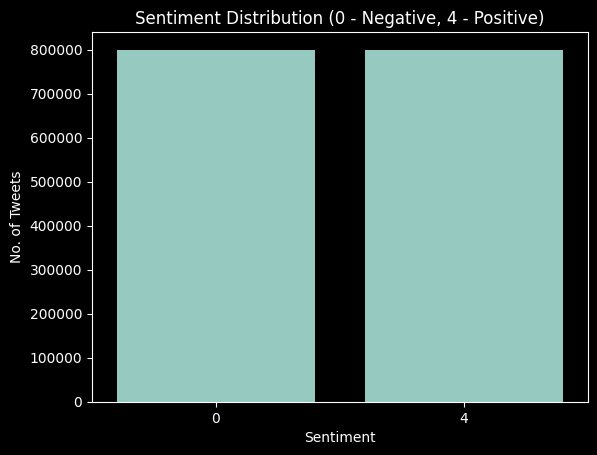

In [36]:
sns.countplot(x=df['Target'])
plt.title('Sentiment Distribution (0 - Negative, 4 - Positive)')
plt.xlabel('Sentiment')
plt.ylabel('No. of Tweets')
plt.show()

#### **Below we have divided the dataset into 2 parts:**

1.   Positive Tweets
2.   Negative Tweets



In [37]:
positive_tweets = df[df['Target'] == 4]
negative_tweets = df[df['Target'] == 0]

print("Positive Tweets:\n")
display(positive_tweets['Cleaned Tweets'].head())
display(negative_tweets['Cleaned Tweets'].head())
print("\nNegative Tweets:\n")
display(positive_tweets['Cleaned Tweets'].tail())
display(negative_tweets['Cleaned Tweets'].tail())

Positive Tweets:



799999                             i love u guys r the best
800000    im meeting up with one of my besties tonight c...
800001    thanks for the twitter add sunisa i got to mee...
800002    being sick can be really cheap when it hurts t...
800003                       he has that effect on everyone
Name: Cleaned Tweets, dtype: object

0    is upset that he cant update his facebook by t...
1    i dived many times for the ball managed to sav...
2       my whole body feels itchy and like its on fire
3    no its not behaving at all im mad why am i her...
4                                   not the whole crew
Name: Cleaned Tweets, dtype: object


Negative Tweets:



1599994    just woke up having no school is the best feel...
1599995    thewdbcom very cool to hear old walt interviews â
1599996    are you ready for your mojo makeover ask me fo...
1599997    happy 38th birthday to my boo of alll time tup...
1599998                                                happy
Name: Cleaned Tweets, dtype: object

799994      sick spending my day laying in bed listening to
799995                                        gmail is down
799996                          rest in peace farrah so sad
799997    sounds like a rival is flagging your ads not m...
799998    has to resit exams over summer wishes he worke...
Name: Cleaned Tweets, dtype: object

#### **Defining a function to extract all words from each tweet**

In [38]:
# Method 1: Defining a function for getting whole Words from Tweets distributed by Positive and Negative
def tweets_word_bank_1(word_bank):
  words = []
  for text in word_bank['Cleaned Tweets']:
    words.append(text)
  # print(positives)
  tweet_word_bank = []
  for word in words:
    posi_words = word.split()
    for i in posi_words:
      tweet_word_bank.append(i)
  return tweet_word_bank

In [ ]:
positive_word_bank_1 = tweets_word_bank_1(positive_tweets)
negative_word_bank_1 = tweets_word_bank_1(negative_tweets)

In [40]:
print("No. of words in Positive Tweets: ", len(positive_word_bank_1))
print("No. of words in Negative Tweets: ", len(negative_word_bank_1))

No. of words in Positive Tweets:  9480132
No. of words in Negative Tweets:  10349306


In [41]:
# Method 2: Defining a function for getting whole Words from Tweets distributed by Positive and Negative
def tweets_word_bank(word_bank):
  all_lines = ' '.join([text for text in word_bank['Cleaned Tweets']])
  all_words = all_lines.split()
  return all_words

In [42]:
positive_word_bank = tweets_word_bank(positive_tweets)
negative_word_bank = tweets_word_bank(negative_tweets)

In [43]:
print("No. of words in Positive Tweets: ", len(positive_word_bank))
print("No. of words in Negative Tweets: ", len(negative_word_bank))

No. of words in Positive Tweets:  9480132
No. of words in Negative Tweets:  10349306


#### **Here we can see, There are 9498877 words present in Positive Tweets, and 10363483 words present in Negative Tweets.**

In [44]:
positive_tweets[positive_tweets['Cleaned Tweets'].str.contains(r'love')]

,Target,ID,Date,User,Cleaned Tweets
799999,4,1467822272,Mon Apr 06 22:22:45 PDT 2009,ersle,i love u guys r the best
800006,4,1467822465,Mon Apr 06 22:22:48 PDT 2009,jessicavaliyi,i am so jealous hope you had a great time in v...
800010,4,1467822531,Mon Apr 06 22:22:49 PDT 2009,Hollywood_Trey,how did i forget about two and a half men i lo...
800040,4,1467824088,Mon Apr 06 22:23:13 PDT 2009,Dori23,hi jon great to hear from you see you on the c...
800045,4,1467824298,Mon Apr 06 22:23:17 PDT 2009,zubatnpsyduck,today is our two month anniversary i love you ...
...,...,...,...,...,...
1599923,4,2193576003,Tue Jun 16 08:38:43 PDT 2009,izzybizzy113,haha yeah but of course i love mcfly more lol
1599934,4,2193576534,Tue Jun 16 08:38:45 PDT 2009,Essence05,omg i loveeeee frosted flakes with bananas on ...
1599942,4,2193576854,Tue Jun 16 08:38:47 PDT 2009,lindsaycherry,i love all the pics
1599943,4,2193577021,Tue Jun 16 08:38:48 PDT 2009,eyesandwings,a star bowl (she loves stars) filled with dark...


In [45]:
pd.Series(positive_word_bank).value_counts()[15:25]

that    68383
with    64818
so      63783
have    61863
just    61533
good    60616
be      53886
its     49189
at      49088
love    46733
Name: count, dtype: int64

## **EDA Visualizations**

#### **1. Distribution of Sentiment of Tweets in Dataset**

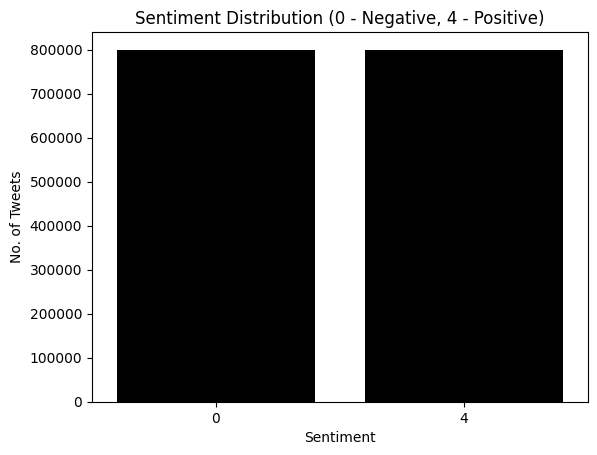

In [46]:
# Distribution of Sentiment in dataset
plt.style.use('default')
# plt.figure(figsize=(10, 6))
sns.countplot(x=df['Target'], color='black')
plt.title('Sentiment Distribution (0 - Negative, 4 - Positive)')
plt.xlabel('Sentiment')
plt.ylabel('No. of Tweets')
plt.savefig('Images/plots/sentiment_distribution.png')
plt.show()

#### **2. Most Frequent words present in Positive Tweets**

In [47]:
positive_word_bank[:20]

['i',
 'love',
 'u',
 'guys',
 'r',
 'the',
 'best',
 'im',
 'meeting',
 'up',
 'with',
 'one',
 'of',
 'my',
 'besties',
 'tonight',
 'cant',
 'wait',
 'girl',
 'talk']

In [48]:
# Converting list element into Series for ease
positive_word_bank = pd.Series(positive_word_bank)
positive_word_bank_value_counts = positive_word_bank.value_counts()
positive_word_bank_value_counts.head(20)

i       287070
the     262089
to      249241
a       200114
you     174961
and     146078
my      124105
for     116440
it      111160
is      107225
in       99499
of       90601
on       83303
im       74352
me       69554
that     68383
with     64818
so       63783
have     61863
just     61533
Name: count, dtype: int64

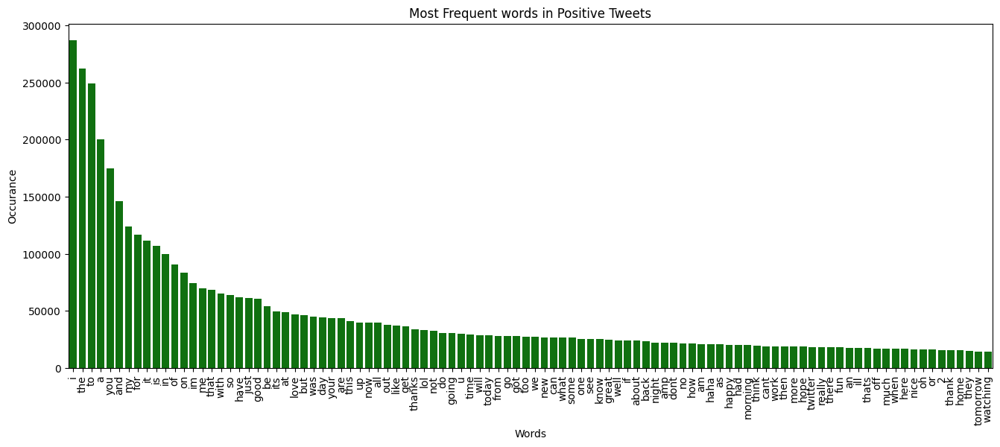

In [49]:
plt.figure(figsize=(16, 6))
plt.title("Most Frequent words in Positive Tweets")
sns.barplot(x=positive_word_bank_value_counts.index[:100], y=positive_word_bank_value_counts.values[:100], color='green')
plt.xticks(rotation=90)
plt.xlabel("Words")
plt.ylabel("Occurance")
plt.savefig('Images/plots/Most Frequent words in Positive Tweets.png')
plt.show()

#### **Here we can see, that words like "good", "love", "like", "thanks", "lol", "great", "well", "haha", "happy", "morning", "hope", "more", "fun", "really", "nice", "oh", "thank", "home", "awesome" and more are used in Positive Tweets.**

#### **3. Most Frequent words present in Negative Tweets**

In [50]:
negative_word_bank[:20]

['is',
 'upset',
 'that',
 'he',
 'cant',
 'update',
 'his',
 'facebook',
 'by',
 'texting',
 'it',
 'and',
 'might',
 'cry',
 'as',
 'a',
 'result',
 'school',
 'today',
 'also']

In [51]:
negative_word_bank = pd.Series(negative_word_bank)
negative_word_bank_value_counts = negative_word_bank.value_counts()
negative_word_bank_value_counts.head(20)

i       460818
to      309335
the     254637
my      186983
a       186473
and     150387
is      126631
it      118285
in      114037
im      102189
for      98402
you      93405
of       92294
me       89730
so       86763
on       83375
have     82199
but      81052
not      72534
that     72281
Name: count, dtype: int64

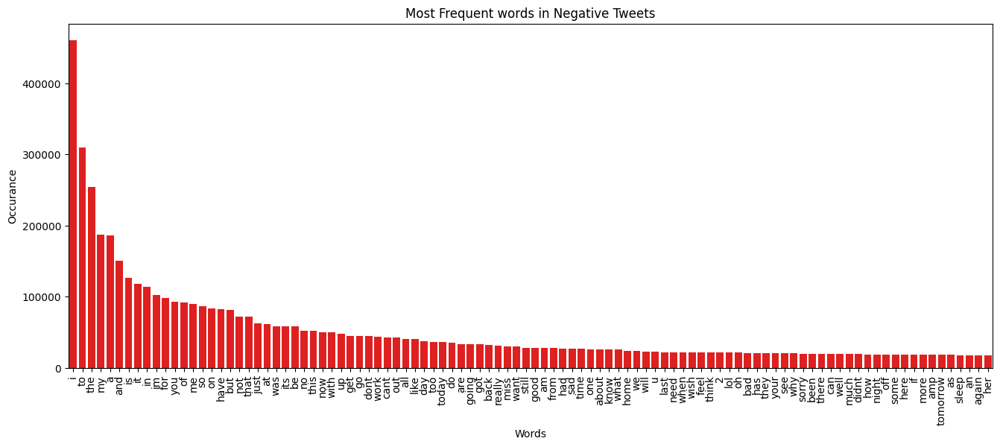

In [52]:
plt.figure(figsize=(16, 6))
plt.title("Most Frequent words in Negative Tweets")
sns.barplot(x=negative_word_bank_value_counts.index[:100], y=negative_word_bank_value_counts.values[:100], color='red')
plt.xticks(rotation=90)
plt.xlabel("Words")
plt.ylabel("Occurance")
plt.savefig('Images/plots/Most frequent words in Negative Tweets.png')
plt.show()

#### **Here we can see, words like "but", "not", "no", "go", "out", "too", "don't", "can't", "miss", "want", "still", "sad", "last", "need", "wish", "feel", "lol", "bad", "sorry", "why", "off", "ah", "only" and more are mostly used in Negative Tweets.**

---

# **Feature Engineering:**

In [53]:
df.head()

,Target,ID,Date,User,Cleaned Tweets
0,0,1467810672,Mon Apr 06 22:19:49 PDT 2009,scotthamilton,is upset that he cant update his facebook by t...
1,0,1467810917,Mon Apr 06 22:19:53 PDT 2009,mattycus,i dived many times for the ball managed to sav...
2,0,1467811184,Mon Apr 06 22:19:57 PDT 2009,ElleCTF,my whole body feels itchy and like its on fire
3,0,1467811193,Mon Apr 06 22:19:57 PDT 2009,Karoli,no its not behaving at all im mad why am i her...
4,0,1467811372,Mon Apr 06 22:20:00 PDT 2009,joy_wolf,not the whole crew


#### **Removing non useful features**

In [54]:
df.drop(columns=['ID', 'User'], inplace=True)
df.head()

,Target,Date,Cleaned Tweets
0,0,Mon Apr 06 22:19:49 PDT 2009,is upset that he cant update his facebook by t...
1,0,Mon Apr 06 22:19:53 PDT 2009,i dived many times for the ball managed to sav...
2,0,Mon Apr 06 22:19:57 PDT 2009,my whole body feels itchy and like its on fire
3,0,Mon Apr 06 22:19:57 PDT 2009,no its not behaving at all im mad why am i her...
4,0,Mon Apr 06 22:20:00 PDT 2009,not the whole crew


In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599999 entries, 0 to 1599998
Data columns (total 3 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   Target          1599999 non-null  int64 
 1   Date            1599999 non-null  object
 2   Cleaned Tweets  1599999 non-null  object
dtypes: int64(1), object(2)
memory usage: 36.6+ MB


#### **Converting text feature "Cleaned TWeets" into vector/matrix using TF-IDF Vectorizer:**


In [56]:
vectorizer = TfidfVectorizer()
data = df.copy()

#### **Here we can, how TF-IDF have differentiated words by there importance from "Cleaned Tweets" feature**

In [57]:
vectorizer.fit(data['Cleaned Tweets'])
vocab = vectorizer.vocabulary_
print(f"Vocabulary from Cleaned Tweets feature: {vocab}")

Vocabulary from Cleaned Tweets feature: {'is': 185156, 'upset': 395579, 'that': 368585, 'he': 162809, 'cant': 68944, 'update': 394943, 'his': 168452, 'facebook': 125532, 'by': 66160, 'texting': 367685, 'it': 185947, 'and': 28651, 'might': 232581, 'cry': 90608, 'as': 34600, 'result': 313762, 'school': 325646, 'today': 376495, 'also': 25978, 'blah': 53235, 'dived': 104991, 'many': 223956, 'times': 374530, 'for': 136066, 'the': 369044, 'ball': 42495, 'managed': 223000, 'to': 376251, 'save': 324207, '50': 10529, 'rest': 313500, 'go': 148862, 'out': 267125, 'of': 259906, 'bounds': 58546, 'my': 244792, 'whole': 411527, 'body': 55758, 'feels': 129376, 'itchy': 186164, 'like': 210530, 'its': 186673, 'on': 263235, 'fire': 132075, 'no': 253579, 'not': 255709, 'behaving': 47775, 'at': 36066, 'all': 24552, 'im': 179493, 'mad': 220791, 'why': 411967, 'am': 26407, 'here': 165703, 'because': 46375, 'see': 327974, 'you': 425689, 'over': 268098, 'there': 369926, 'crew': 89562, 'need': 248598, 'hug': 17

#### **Now going ahead, we will preprocess "Cleaned Tweets" for machine learning**

In [58]:
tweets_vectorized = vectorizer.fit_transform(data['Cleaned Tweets'])
print(tweets_vectorized)

  (0, 53235)	0.3076519801183129
  (0, 25978)	0.2274799909303908
  (0, 376495)	0.1586753421774235
  (0, 325646)	0.20394483805439434
  (0, 313762)	0.33306721023522623
  (0, 34600)	0.18481533602598496
  (0, 90608)	0.2600031206589152
  (0, 232581)	0.23020414077738832
  (0, 28651)	0.10468646817700462
  (0, 185947)	0.11502716446057493
  (0, 367685)	0.3264019955906112
  (0, 66160)	0.1939854713832993
  (0, 125532)	0.2615053927893338
  (0, 168452)	0.2141334039813588
  (0, 394943)	0.2610946323848959
  (0, 68944)	0.16025448008379067
  (0, 162809)	0.19410861599849424
  (0, 368585)	0.13094896488637855
  (0, 395579)	0.2778979477683569
  (0, 185156)	0.11244300920010358
  (1, 58546)	0.4316969347060212
  (1, 259906)	0.11393888064478559
  (1, 267125)	0.14119093746997677
  (1, 148862)	0.1450651218060562
  (1, 313500)	0.23648471670750124
  :	:
  (1599995, 163443)	0.253611133097466
  (1599995, 376251)	0.09409708495209099
  (1599996, 222208)	0.4865209649146042
  (1599996, 237003)	0.4878833809428058
  (15999

---
# **Model Development**

#### **Developing a Model using Logistric Regression**

In [ ]:
# Differentiating target variable and tweets
X = tweets_vectorized
y = data['Target']

# Splitting dataset into two parts Training and Testing with the margin of 80-20
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Deploying a Logistic Regression Model
model = LogisticRegression(max_iter=300)
# Fitting the model on training datasets
model.fit(X_train, y_train)
# Predicting
y_pred = model.predict(X_test)
# print("Accuracy: ", accuracy_score(y_test, y_pred))

c:\Users\sohai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [80]:
# Minor Tuning for better Accuracy
iters = [100, 200, 300, 400]
def get_accuracy(iter):
    model = LogisticRegression(max_iter=iter)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"Accuracy with {iter}: {accuracy_score(y_test, y_pred)}")

for iter in iters:
    get_accuracy(iter)

c:\Users\sohai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy with 100: 0.7975


c:\Users\sohai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy with 200: 0.797865625


c:\Users\sohai\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy with 300: 0.798015625
Accuracy with 400: 0.798003125


In [61]:
print("Accuracy: ", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))

Accuracy:  0.797865625
              precision    recall  f1-score   support

           0       0.81      0.78      0.79    159494
           4       0.79      0.81      0.80    160506

    accuracy                           0.80    320000
   macro avg       0.80      0.80      0.80    320000
weighted avg       0.80      0.80      0.80    320000



##### **Checking Some Predictions:**

In [62]:
def predict_this(new_tweet, model):
  cleaned_tweet = clean_tweet(new_tweet)
  cleaned_tweet_vectorized = vectorizer.transform([cleaned_tweet])
  prediction = model.predict(cleaned_tweet_vectorized)
  if prediction == 0:
    return "Negative"
  elif prediction == 4:
    return "Positive"
  # return prediction

In [63]:
# 1. I hate you
print(predict_this("I hate you", model))
# 2. I love you
print(predict_this("I love you", model))
# 3. I don't like that!
print(predict_this("I don't like that!", model))
# 4. Nice to meet you!
print(predict_this("Nice to meet you!", model))

Negative
Positive
Negative
Positive


### **Creating a Random Forest Model:**
#### *Since we know that using Random Forest on this large dataset is computationally very expensive, so we are using sample of the dataset*

In [64]:
# sample_df = df.sample(frac=0.1, random_state=42)
# sample_df.head()
# sample_df['Target'].value_counts()

In [65]:
# plt.figure(figsize=(8, 6))
# sns.countplot(x=sample_df['Target'])
# plt.title("Distribution of Target variable in Sample dataset")
# plt.show()

In [66]:
# # Preprocessing the Cleaned Tweets column 
# sample_clean_tweets = vectorizer.fit_transform(sample_df['Cleaned Tweets'])
# print(sample_clean_tweets)

In [67]:
# X = sample_clean_tweets
# y = sample_df['Target']

# X_train_sample, X_test_sample, y_train_sample, y_test_sample = train_test_split(X, y, test_size=0.2, random_state=42)

# model2 = RandomForestClassifier()
# model2.fit(X_train_sample, y_train_sample)
# y_pred2 = model2.predict(X_test_sample)

# print(f"Accuracy of {model2}: {accuracy_score(y_pred2, y_test)}")

#### *While using sample of the dataset, it is still very computationally expensive to train a model using Random Forest Classifier. So, we can skip it or can try different algorithm.*

---
# **Model Evaluation**
#### **Here we will evaluate the model using some important evaluation metrics like Accuracy, Precision, Recall and F1-Score**

In [68]:
# sklearn provides a cclassification_report which gives all above metrics for evaluating the model
print("Accuracy of Logistic Regression: ", accuracy_score(y_test, y_pred))
print("\nClassification Report for Logistic Regression model:\n", classification_report(y_test, y_pred))

Accuracy of Logistic Regression:  0.797865625

Classification Report for Logistic Regression model:
               precision    recall  f1-score   support

           0       0.81      0.78      0.79    159494
           4       0.79      0.81      0.80    160506

    accuracy                           0.80    320000
   macro avg       0.80      0.80      0.80    320000
weighted avg       0.80      0.80      0.80    320000



In [69]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix: \n", cm)

Confusion Matrix: 
 [[124699  34795]
 [ 29888 130618]]


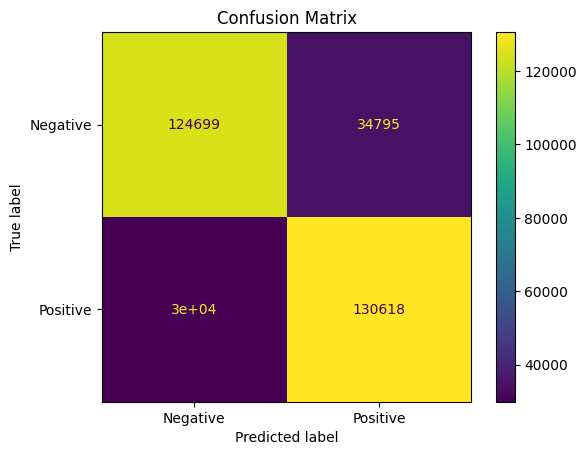

In [70]:
# Confusion matrix

conf_mat = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Negative", "Positive"])
conf_mat.plot()
plt.title("Confusion Matrix")
plt.savefig('Images/plots/Confusion Matrix 1.png')
plt.show()

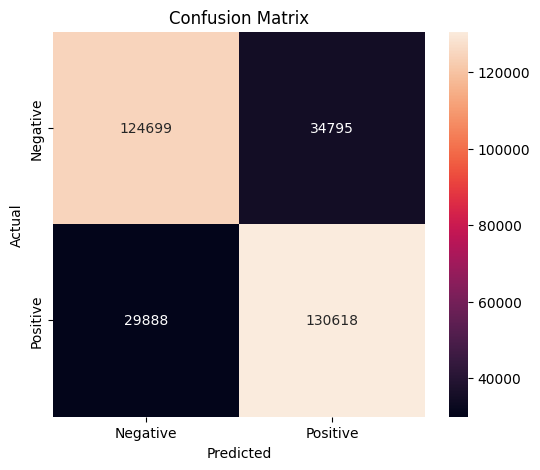

In [71]:
# Confusion matrix using Seaborn

plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.savefig('Images/plots/Confusion Matrix 2.png')
plt.show()

### **Confusion Matrix Insights:**
1. **True Negatives(TN):** The model has correctly predicted 124699 actual *negative* records as *negative*.
2. **False Negatives(TF):** The model has incorrectly predicted 34795 actual *negative* records as *positive*.
3. **False Positives(FP):** The model has incorrectly predicted 29888 actual *positive* records as *negative*.
4. **True Positives(TP):** The model has correctly predicted 130618 actual *positive* records as *positive*.

---
# **Model Deployment**
#### **Deploying the model and trained vocabulary using Pickle**

In [72]:
with open('Deployed Model/Logistic_regression_sentiment.pkl', 'wb') as file:
    pickle.dump(model, file)

In [73]:
with open('Deployed Model/vectorized_vocab.pkl', 'wb') as vector:
    pickle.dump(vectorizer, vector)

---
# **Visualizations and Insights**

#### **1. Distribution of Sentiment of Tweets in Dataset**

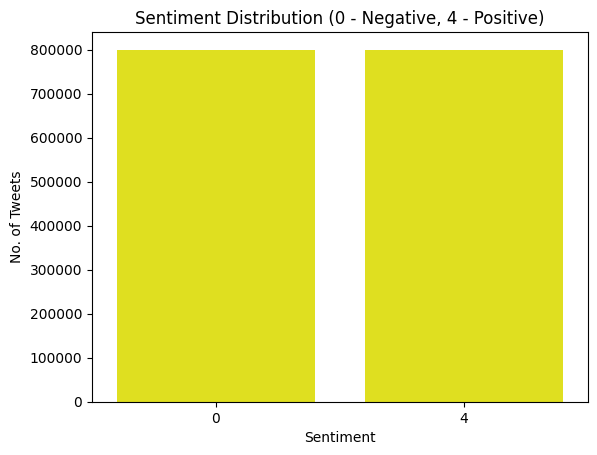

In [74]:
# Distribution of Sentiment in dataset
plt.style.use('default')
# plt.figure(figsize=(10, 6))
sns.countplot(x=df['Target'], color='yellow')
plt.title('Sentiment Distribution (0 - Negative, 4 - Positive)')
plt.xlabel('Sentiment')
plt.ylabel('No. of Tweets')
plt.savefig('Images/plots/Sentiment Distribution.png')
plt.show()

#### 2. **Common Keywords in tweets present in both Positive & Negative tweets**

Here we can see there are over 19 Million words present in tweets

In [75]:
word_bank = positive_word_bank_1 + negative_word_bank_1
len(word_bank)

19829438

##### **This 50 words are most common words present in tweets**

In [76]:
common_keywords = dict(Counter(word_bank).most_common(50))

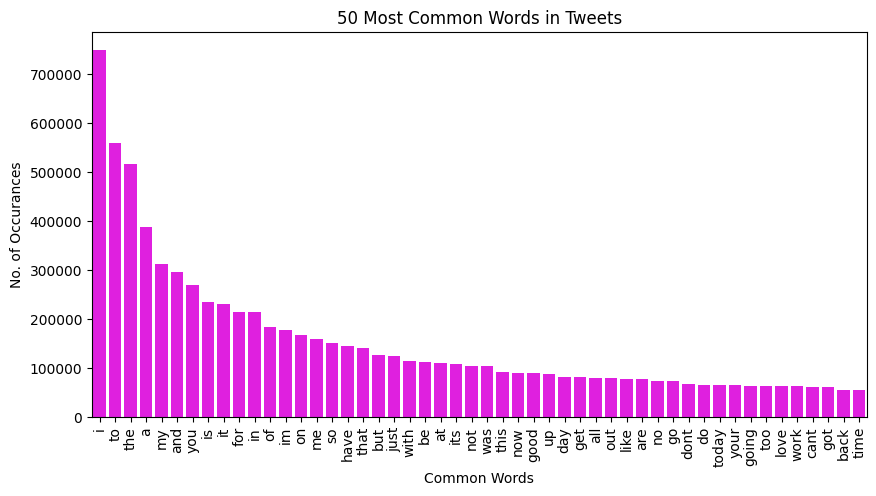

In [77]:
plt.figure(figsize=(10, 5))
sns.barplot(x=common_keywords.keys(), y=common_keywords.values(), color='magenta')
plt.title("50 Most Common Words in Tweets")
plt.xlabel("Common Words")
plt.ylabel("No. of Occurances")
plt.xticks(rotation=90)
plt.savefig("Images/plots/Most Common Words in Tweets")
plt.show()

#### **Here we can most common words used in tweets are "I, to, the, a, my, and, you, is, it, for, in, of , I'm, on, so, have, that, but, just, with, be, at, its, was, this, can't, etc".**
#### **These words contains Pronouns, Articles, Prepositions, Conjuctions, Auxiliary Verbs, Adjectives.**
#### **They are known as function words or core vocabulary.**

### **Change in Sentiments on different words**

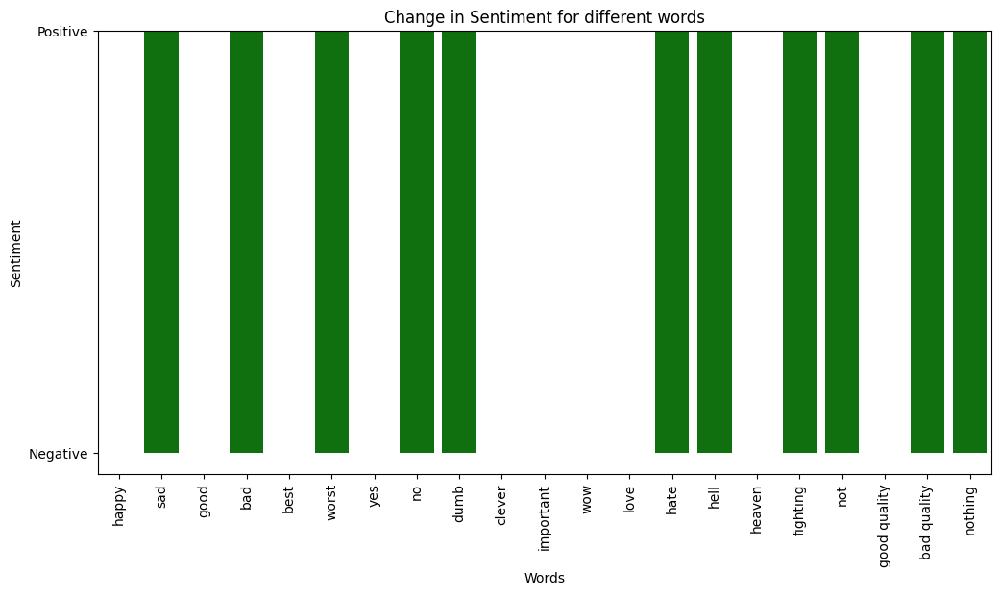

In [ ]:
words =  ["happy", "sad", "good", "bad", "best", "worst", "yes", "no", "dumb", "clever", "important", "wow", 
          "love", "hate", "hell", "heaven", "fighting", "not", "good quality", "bad quality", "nothing"]
values = [predict_this(i, model) for i in words]
# print(values)

plt.figure(figsize=(12, 6))
plt.title("Change in Sentiment for different words")
plt.xlabel("Words")
plt.ylabel("Sentiment")
sns.barplot(x=words, y=values, color='green')
plt.xticks(rotation=90)
plt.savefig('Images/plots/Sentiment Change on different keywords.png')
plt.show()

#### **Here we can see, that prediction changes to negative when we use words which contains negative sentiment and vice versa.**